# Traitement de données raster

`RasterTools` enveloppe un raster (chemin de fichier ou couple
`(ndarray, profile)`) et expose des méthodes **chaînables** en trois temps :

1. **prétraitement** : contrôle, CRS/résolution, découpage, nettoyage
2. **analyse** : calcul de bandes, indices, statistiques, voisinage, terrain,
   classification, changement, multicritère
3. **post-traitement** : nettoyage, raster→vecteur, cartographie, export

Chaque méthode renvoie un nouvel objet `RasterTools` (`.data` = tableau
NumPy, `.profile` = métadonnées rasterio).

Exemple : un MNT SRTM de la région de **Man** (ouest de la Côte d'Ivoire).

In [1]:
import logging
import sys
from pathlib import Path

sys.path.insert(0, str(Path.cwd().parent))  # cartograpy est à la racine du dépôt
logging.basicConfig(level=logging.INFO, format="%(message)s")

import numpy as np
import matplotlib.pyplot as plt

import cartograpy as cp
from cartograpy import RasterTools
from cartograpy.data import DEM, Bound

BBOX = (-7.65, 7.25, -7.35, 7.55)
tif = DEM(work_dir="_dem_cache").download(BBOX, out_tif="_dem_cache/man.tif")

rt = RasterTools(tif)
info = rt.get_raster_info()
{k: info[k] for k in ("dtype", "width", "height", "count", "crs", "resolution", "nodata")}

C:\Users\Ordinateur\AppData\Roaming\uv\python\cpython-3.12-windows-x86_64-none\Lib\importlib\metadata\__init__.py:467: DeprecationWarning: Implicit None on return values is deprecated and will raise KeyErrors.
  return self.metadata['Version']


Téléchargement DEM:   0%|          | 0/1 [00:00<?, ?tuile/s]

Téléchargement DEM: 100%|██████████| 1/1 [00:05<00:00,  5.12s/tuile]

Téléchargement DEM: 100%|██████████| 1/1 [00:05<00:00,  5.12s/tuile]

{'dtype': 'int16',
 'width': 1081,
 'height': 1081,
 'count': 1,
 'crs': 'EPSG:4326',
 'resolution': (0.0002777777777777778, 0.0002777777777777778),
 'nodata': -32768.0}

## 1. Prétraitement

Contrôler les métadonnées, puis passer en projection métrique et
rééchantillonner à 60 m pour alléger les calculs de terrain.

In [2]:
print("anomalies :", rt.check_raster_metadata()["issues"] or "aucune")
print("nodata    :", rt.check_nodata())

rt_utm = rt.reproject_raster("EPSG:32630").resample_raster(60)
print("avant :", rt.data.shape, rt.profile["crs"])
print("après :", rt_utm.data.shape, rt_utm.profile["crs"], rt_utm.check_resolution())

anomalies : aucune
nodata    : {'nodata_value': -32768.0, 'nodata_count': 0, 'total_pixels': 1168561, 'nodata_pct': 0.0}
avant : (1, 1081, 1081) EPSG:4326
après : (1, 560, 559) EPSG:32630 (60.063308962230394, 60.06596332477784)


## 2. Statistiques et histogramme

{'min': 263.0, 'max': 1259.0, 'mean': 425.3, 'std': 171.7, 'median': 341.0}


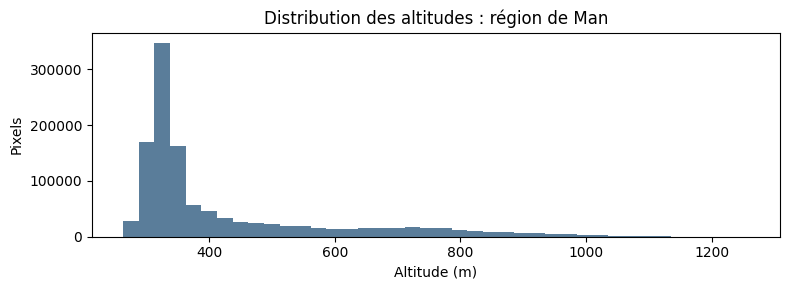

In [3]:
stats = rt.raster_statistics(band_index=0)
print({k: round(v, 1) for k, v in stats.items() if isinstance(v, float)})

hist = rt.histogram_raster(band_index=0, bins=40)
plt.figure(figsize=(8, 3))
plt.bar(hist["edges"][:-1], hist["counts"], width=np.diff(hist["edges"]), align="edge", color="#5a7d9a")
plt.xlabel("Altitude (m)"); plt.ylabel("Pixels")
plt.title("Distribution des altitudes : région de Man")
plt.tight_layout()

## 3. Analyse de terrain

`compute_slope`, `compute_aspect`, `compute_hillshade`, `compute_tpi`
(position topographique)… sur le MNT en projection métrique.

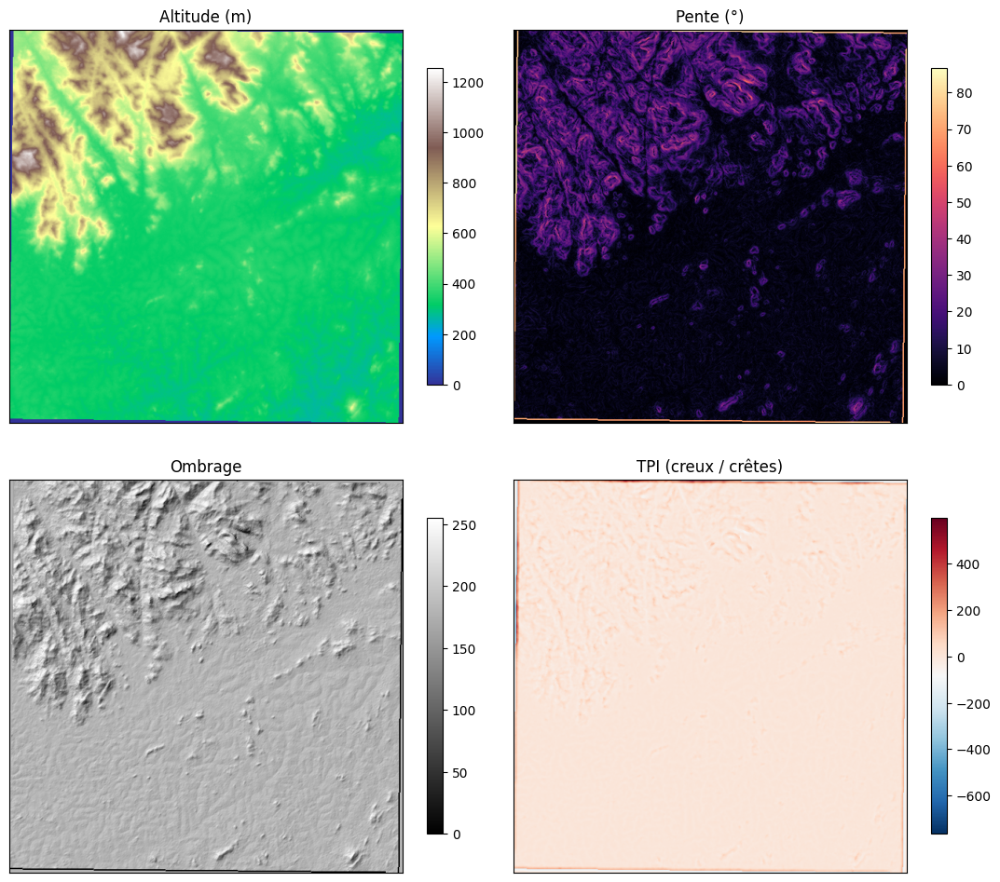

In [4]:
elev = rt_utm.data[0].astype("float64")
elev[elev == rt_utm.profile["nodata"]] = np.nan

pente = rt_utm.compute_slope(degrees=True).data[0]
ombrage = rt_utm.compute_hillshade(azimuth=315, altitude=45).data[0]
tpi = rt_utm.compute_tpi(size=9).data[0]

fig, axes = plt.subplots(2, 2, figsize=(11, 10))
for ax, data, titre, cmap in zip(
    axes.ravel(),
    [elev, pente, ombrage, tpi],
    ["Altitude (m)", "Pente (°)", "Ombrage", "TPI (creux / crêtes)"],
    ["terrain", "magma", "gray", "RdBu_r"],
):
    im = ax.imshow(data, cmap=cmap)
    ax.set_title(titre); ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=ax, shrink=0.7)
fig.tight_layout()

## 4. Reclassement et raster → vecteur

On découpe l'altitude en 4 tranches, puis `polygonize_raster` transforme
les zones homogènes en polygones.

 value  aire_km2
     1     772.0
     2     178.8
     3     115.9
     4      62.7


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 1.00


   Étendue: [-7.76, -7.24, 7.23, 7.57]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 1.00


   Étendue: [-7.76, -7.24, 7.23, 7.57]


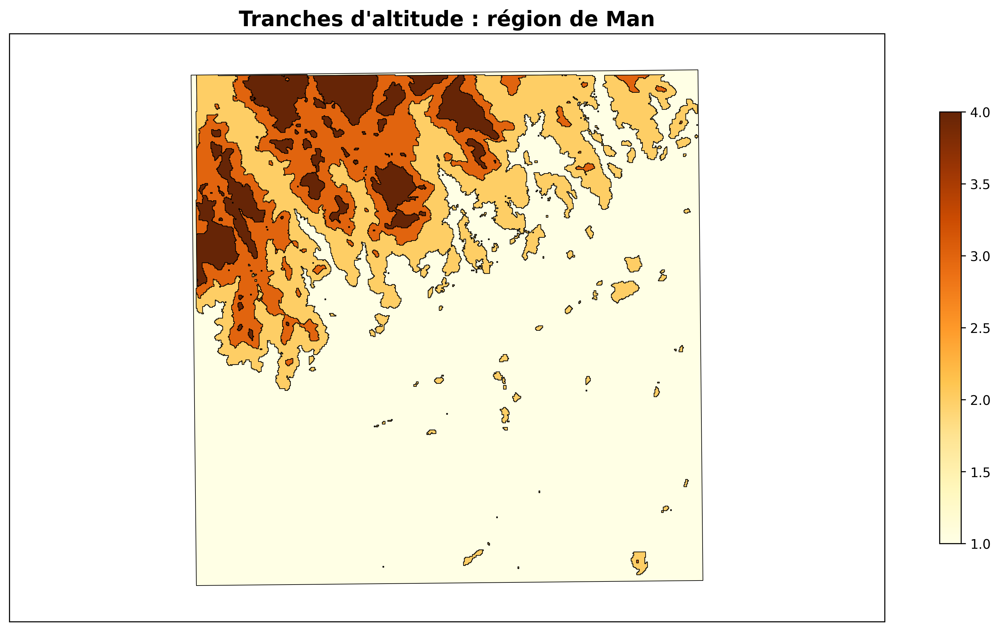

In [5]:
classes = rt_utm.reclassify_raster([(0, 400, 1), (400, 600, 2), (600, 800, 3), (800, 3000, 4)])

zones = classes.polygonize_raster(band_index=0)
zones = zones[zones["value"].between(1, 4)].dissolve(by="value").reset_index()
zones = zones.to_crs("EPSG:4326")
print(zones[["value"]].assign(aire_km2=zones.to_crs("EPSG:32630").area / 1e6).round(1).to_string(index=False))

ETIQ = {1: "< 400 m", 2: "400–600 m", 3: "600–800 m", 4: "> 800 m"}
zones["tranche"] = zones["value"].map(ETIQ)

m = cp.Map(title="Tranches d'altitude : région de Man")
m.add_polygons_choropleth(zones, column_to_plot="value", cmap="YlOrBr", show_labels=False)
m.show()

## 5. Statistiques zonales

`zonal_statistics` agrège les pixels par polygone. Ici l'altitude moyenne
par département (le `GeoDataFrame` doit être dans le CRS du raster).

shapeName   min    max  mean  count
   Guemon 263.0  615.0 323.0 348370
   Tonkpi 270.0 1259.0 469.0 820191
📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 0.82


   Étendue: [-9.28, -6.16, 6.20, 8.28]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 0.82


   Étendue: [-9.28, -6.16, 6.20, 8.28]


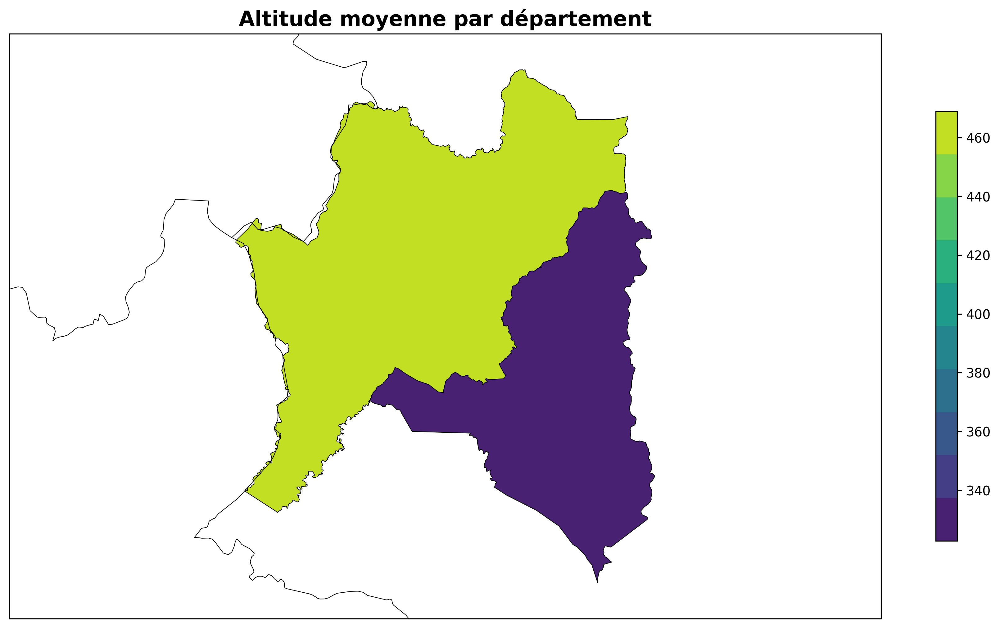

In [6]:
depts = Bound().get_admin("CIV", adm=2).set_crs("EPSG:4326")
xmin, ymin, xmax, ymax = BBOX
depts_zone = depts.cx[xmin:xmax, ymin:ymax].copy()

zs = RasterTools(tif).zonal_statistics(depts_zone, stats=["min", "max", "mean", "count"], band_index=0)
print(zs[["shapeName", "min", "max", "mean", "count"]].round(0).to_string(index=False))

m = cp.Map(title="Altitude moyenne par département")
m.add_polygons_choropleth(zs, column_to_plot="mean", cmap="viridis", show_labels=False)
m.show()

## 6. Courbes de niveau (raster → lignes)

1387 segments de courbe, niveaux : [np.float64(320.0), np.float64(400.0), np.float64(480.0), np.float64(560.0), np.float64(640.0), np.float64(720.0), np.float64(800.0), np.float64(880.0), np.float64(960.0), np.float64(1040.0), np.float64(1120.0), np.float64(1200.0)]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 1.00


   Étendue: [-7.76, -7.24, 7.23, 7.57]


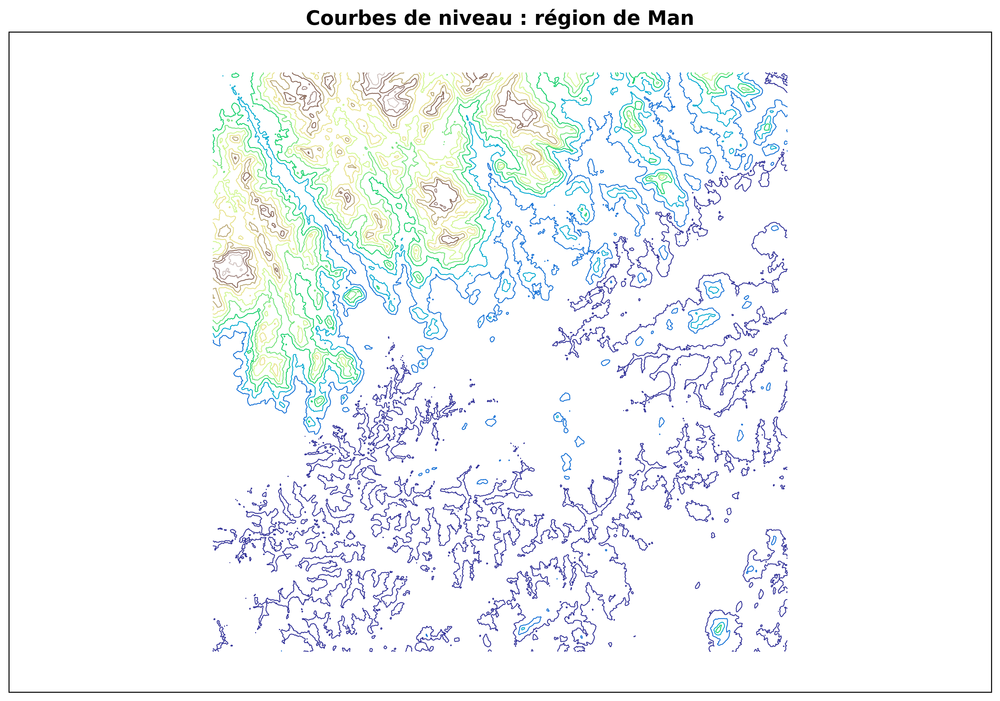

In [7]:
courbes = RasterTools(tif).contours_from_raster(band_index=0, levels=12)
print(len(courbes), "segments de courbe, niveaux :", sorted(courbes["level"].round().unique()))

m = cp.Map(title="Courbes de niveau : région de Man")
m.add_lines(courbes, column="level", cmap="terrain", linewidth=0.7)
m.show()

## 7. Filtres focaux et détection de changement

`focal_mean / focal_median / focal_max / focal_min` appliquent une fenêtre
glissante. `change_detection` (alias `raster_difference`) soustrait deux
rasters — ici le MNT brut moins sa version filtrée = le bruit.

écart brut/filtré : ± 85.0 m


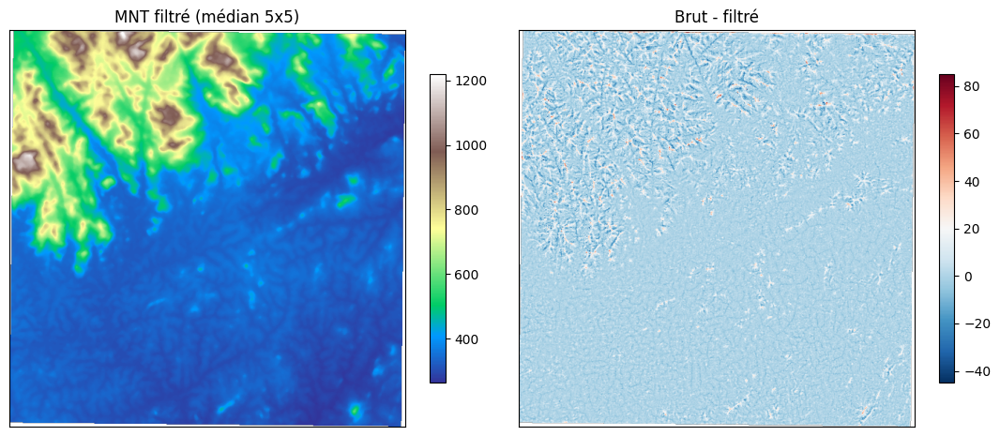

In [8]:
lisse = rt_utm.focal_median(size=5)
bruit = rt_utm.change_detection(lisse)      # MNT brut - MNT filtré

masque = rt_utm.data[0] > 0
brut_arr = np.where(masque, bruit.data[0], np.nan)
print("écart brut/filtré : ±", round(float(np.nanmax(np.abs(brut_arr))), 1), "m")

fig, axes = plt.subplots(1, 2, figsize=(11, 5))
for ax, data, titre, cmap in zip(
    axes, [np.where(masque, lisse.data[0], np.nan), brut_arr],
    ["MNT filtré (médian 5x5)", "Brut - filtré"], ["terrain", "RdBu_r"],
):
    im = ax.imshow(data, cmap=cmap)
    ax.set_title(titre); ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=ax, shrink=0.7)
fig.tight_layout()

## 8. Exposition, rugosité, courbure

Autres dérivées du MNT : `compute_aspect` (orientation des versants),
`compute_tri` (Terrain Ruggedness Index), `compute_curvature`.

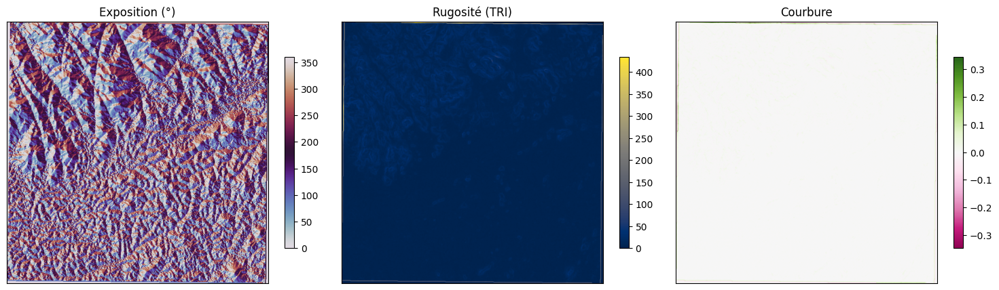

In [9]:
aspect = rt_utm.compute_aspect(degrees=True).data[0]
tri = rt_utm.compute_tri(size=3).data[0]
courbure = rt_utm.compute_curvature().data[0]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, data, titre, cmap in zip(
    axes, [aspect, tri, courbure],
    ["Exposition (°)", "Rugosité (TRI)", "Courbure"],
    ["twilight", "cividis", "PiYG"],
):
    im = ax.imshow(data, cmap=cmap)
    ax.set_title(titre); ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=ax, shrink=0.6)
fig.tight_layout()

## 9. Calculatrice raster

`raster_calculator` (alias `band_math`, `apply_formula`) évalue une
expression NumPy sur les bandes (`B1`, `B2`, …), y compris sur un cube
issu de `band_stacking`.

altitude : 1254 m -> 4114 ft


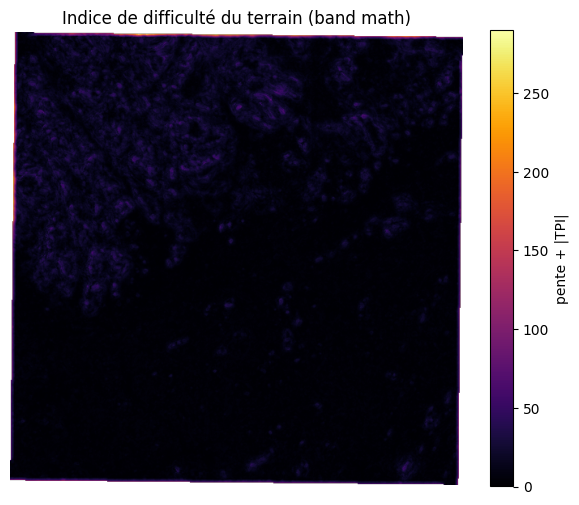

In [10]:
valide = rt_utm.data[0] > 0   # pixels hors bordure de reprojection

# expression NumPy : B1 = 1re bande, B2 = 2e...
pieds = rt_utm.raster_calculator("B1 * 3.28084")
print("altitude :", round(rt_utm.data[0][valide].max()), "m",
      "->", round(pieds.data[0][valide].max()), "ft")

# combinaison de bandes empilées : pente + |TPI|
relief = rt_utm.band_stacking([rt_utm.compute_slope(), rt_utm.compute_tpi(size=9)])
difficulte = relief.raster_calculator("0.6 * B2 + 0.4 * np.abs(B3)")

plt.figure(figsize=(6, 6))
im = plt.imshow(np.where(valide, difficulte.data[0], np.nan), cmap="inferno")
plt.colorbar(im, shrink=0.8, label="pente + |TPI|")
plt.title("Indice de difficulté du terrain (band math)")
plt.axis("off")
plt.tight_layout()

## 10. Empilement et classification non supervisée

`band_stacking` regroupe plusieurs rasters en un cube de bandes ;
`unsupervised_classification` (KMeans) segmente les pixels. `sieve_raster`
nettoie ensuite les petits amas.

bandes empilées : 3 (altitude, pente, TPI)


5 classes de formes de terrain
📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 1.00


   Étendue: [-7.76, -7.24, 7.23, 7.57]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 1.00


   Étendue: [-7.76, -7.24, 7.23, 7.57]


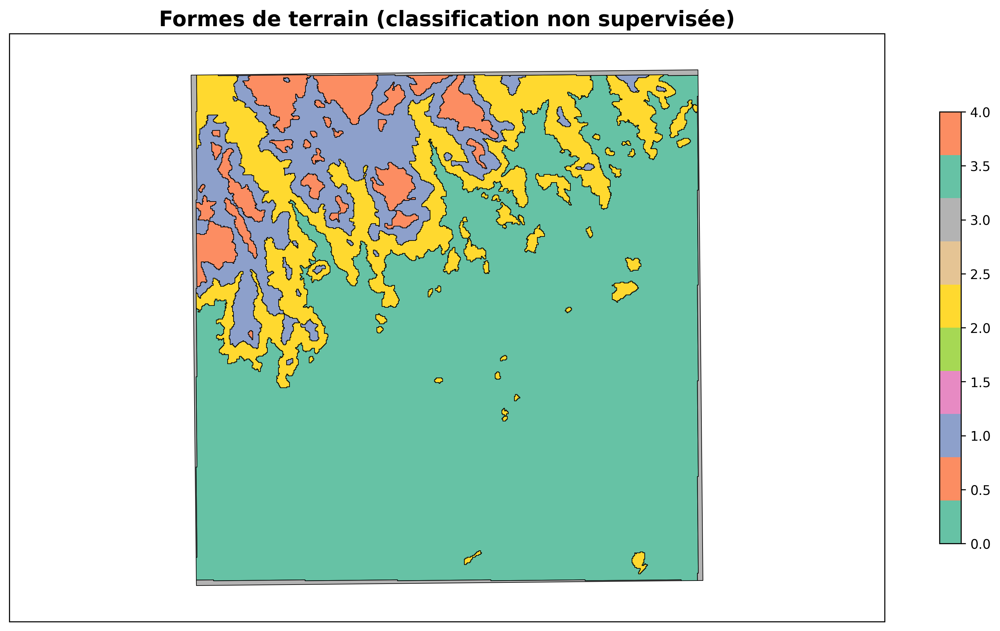

In [11]:
stack = rt_utm.band_stacking([rt_utm.compute_slope(), rt_utm.compute_tpi(size=9)])
print("bandes empilées :", stack.data.shape[0], "(altitude, pente, TPI)")

formes = stack.unsupervised_classification(n_classes=5, method="minibatch")
formes = formes.sieve_raster(threshold=25)          # supprime les amas < 25 px

polys = formes.polygonize_raster(band_index=0)
polys = polys[polys["value"] >= 0].dissolve(by="value").reset_index().to_crs("EPSG:4326")
print(len(polys), "classes de formes de terrain")

m = cp.Map(title="Formes de terrain (classification non supervisée)")
m.add_polygons_choropleth(polys, column_to_plot="value", cmap="Set2", show_labels=False)
m.show()

## 11. Analyse multicritère

`normalize_criteria` ramène chaque critère à 0–1 ; `weighted_overlay`
combine plusieurs rasters avec des poids. Ici un indice d'aptitude à
l'implantation (faible pente + basse altitude).

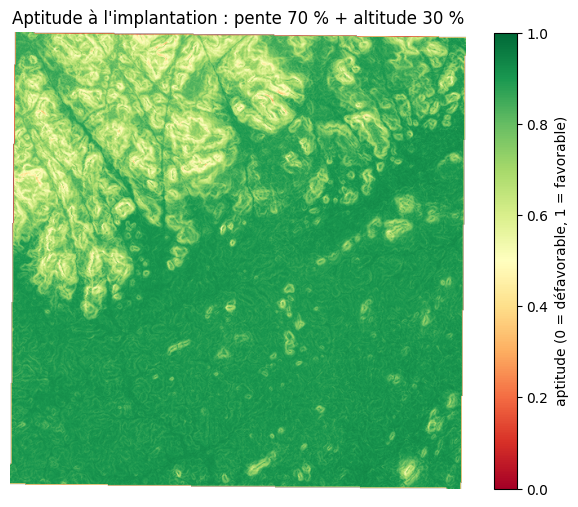

In [12]:
pente_norm = rt_utm.compute_slope().normalize_criteria(method="minmax")
alt_norm = rt_utm.normalize_criteria(band_index=0, method="minmax")

# aptitude à l'implantation : on privilégie faible pente ET basse altitude
aptitude = pente_norm.raster_calculator("1 - B1").weighted_overlay(
    [alt_norm.raster_calculator("1 - B1")], weights=[0.7, 0.3]
)

a = np.where(valide, aptitude.data[0], np.nan)
plt.figure(figsize=(6, 6))
im = plt.imshow(a, cmap="RdYlGn", vmin=0, vmax=1)
plt.colorbar(im, shrink=0.8, label="aptitude (0 = défavorable, 1 = favorable)")
plt.title("Aptitude à l'implantation : pente 70 % + altitude 30 %")
plt.axis("off")
plt.tight_layout()

## 12. Découpe par polygone et échantillonnage

`clip_raster` restreint le raster à une géométrie ; `raster_to_points`
convertit chaque pixel en point (on rééchantillonne d'abord pour ne pas
générer un million de points).

emprise découpée : (1, 1081, 1081)


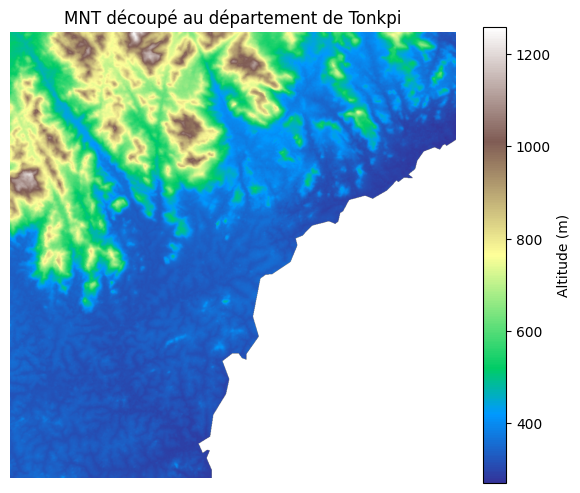

In [13]:
depts_all = Bound().get_admin("CIV", adm=2).set_crs("EPSG:4326")
tonkpi = depts_all[depts_all["shapeName"] == "Tonkpi"]

decoupe = RasterTools(tif).clip_raster(tonkpi, crop=True)
print("emprise découpée :", decoupe.data.shape)

d = decoupe.data[0].astype("float64")
d[d == decoupe.profile["nodata"]] = np.nan
plt.figure(figsize=(6, 6))
im = plt.imshow(d, cmap="terrain")
plt.colorbar(im, shrink=0.8, label="Altitude (m)")
plt.title("MNT découpé au département de Tonkpi")
plt.axis("off")
plt.tight_layout()

900 points d'altitude
📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 0.89


   Étendue: [-9.11, -6.43, 6.47, 8.26]


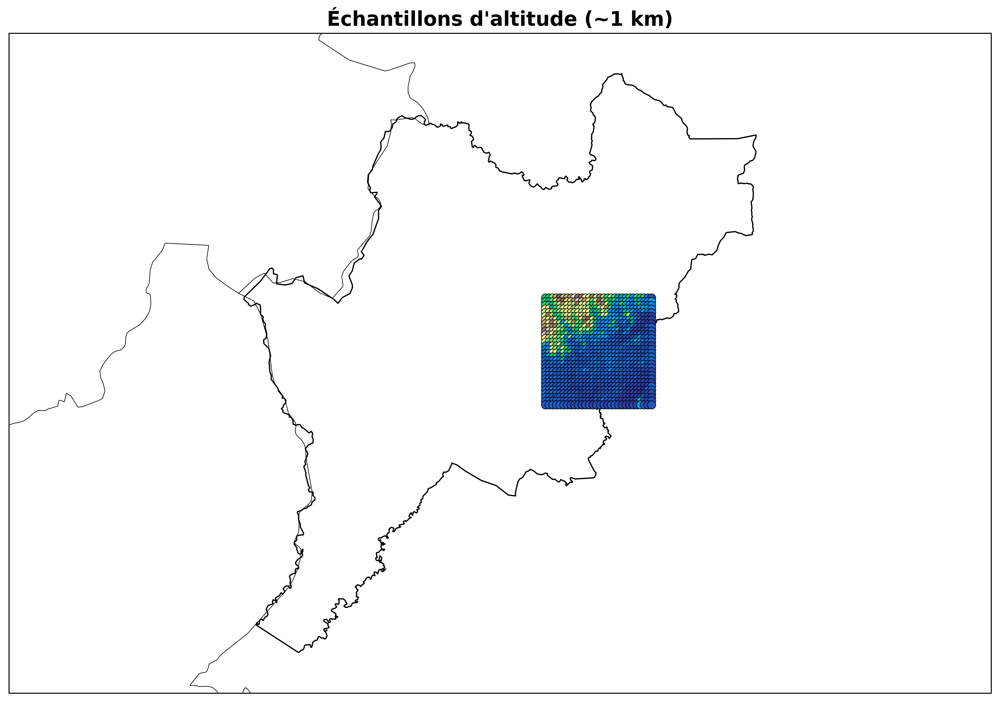

In [14]:
echantillons = (
    RasterTools(tif)
    .resample_raster(0.01)              # ~1 km avant conversion
    .raster_to_points(band_index=0)
)
echantillons = echantillons[echantillons["value"] > 0]
print(len(echantillons), "points d'altitude")

m = cp.Map(title="Échantillons d'altitude (~1 km)")
m.add_polygons(tonkpi, facecolor="none", edge_color="black", linewidth=1, alpha=1)
m.add_points(echantillons, column="value", cmap="terrain", size=45)
m.show()

# Imagerie satellitaire

Les sections suivantes passent du MNT à une image **Sentinel-2**
(4 bandes) téléchargée via Google Earth Engine : indices spectraux,
puis classification supervisée de l'occupation du sol.

## 13. Télécharger une image Sentinel-2

Nécessite l'authentification GEE (voir notebook 8) et un fichier `.env` à
la racine du dépôt contenant `GEE_PROJECT=ee-kanicetcyrille`.

✅ Google Earth Engine initialisé avec succès.


📡 Sentinel-2 : 7 image(s) trouvée(s) [2024-01-01 → 2024-03-31]


⬇️  Téléchargement vers «_raster_cache\kossou_s2.tif» (scale=30m, crs=EPSG:4326)…


Generating URL ...


Please wait ...


Data downloaded to C:\Users\Ordinateur\OneDrive\cartograpy\notebooks\_raster_cache\kossou_s2.tif
✅ Fichier sauvegardé : _raster_cache\kossou_s2.tif


CPLE_AppDefined in kossou_s2.tif: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


CPLE_AppDefined in TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


4 bandes, 669x669 px


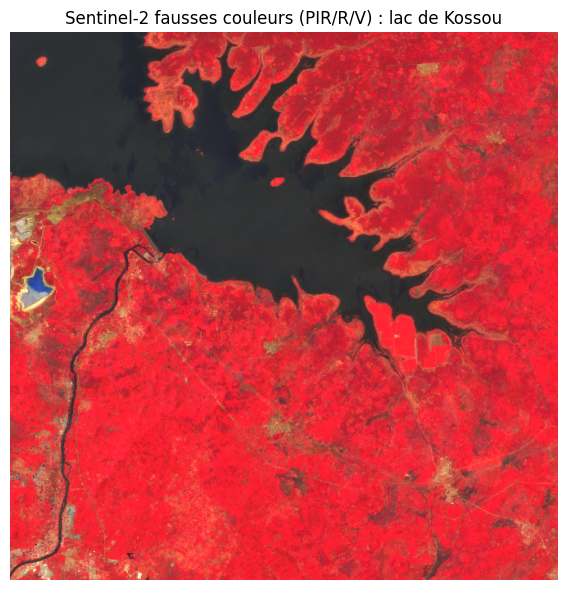

In [15]:
from dotenv import load_dotenv
from cartograpy.data import Gee

load_dotenv(Path.cwd().parent / ".env")   # GEE_PROJECT=ee-kanicetcyrille

S2_BBOX = [-5.52, 6.92, -5.34, 7.10]      # Lac de Kossou : eau, rives boisées, cultures
gee = Gee()
s2 = gee.get_sentinel2(S2_BBOX, "2024-01-01", "2024-03-31", cloud=0.2,
                       bands=["B3", "B4", "B8", "B11"])   # vert, rouge, PIR, MIR
s2_tif = gee.download(s2, bbox=S2_BBOX, filename="kossou_s2.tif",
                      bands=["B3", "B4", "B8", "B11"], scale=30, output_dir="_raster_cache")

rs = RasterTools(str(s2_tif))
print(rs.get_raster_info()["count"], "bandes,", "x".join(map(str, rs.data.shape[1:])), "px")

# composition fausses couleurs (PIR / Rouge / Vert) : la végétation ressort en rouge
fc = np.dstack([rs.data[2], rs.data[1], rs.data[0]])
plt.figure(figsize=(6, 6))
plt.imshow(np.clip(fc / 0.3, 0, 1))
plt.title("Sentinel-2 fausses couleurs (PIR/R/V) : lac de Kossou")
plt.axis("off"); plt.tight_layout()

## 14. Indices spectraux

`RasterTools` fournit `ndvi`, `ndwi`, `ndbi` et `spectral_index` (indice
normalisé générique). Ils sont équivalents à un `raster_calculator` sur les
bonnes bandes.

NDVI helper vs manuel, écart max : 0.0


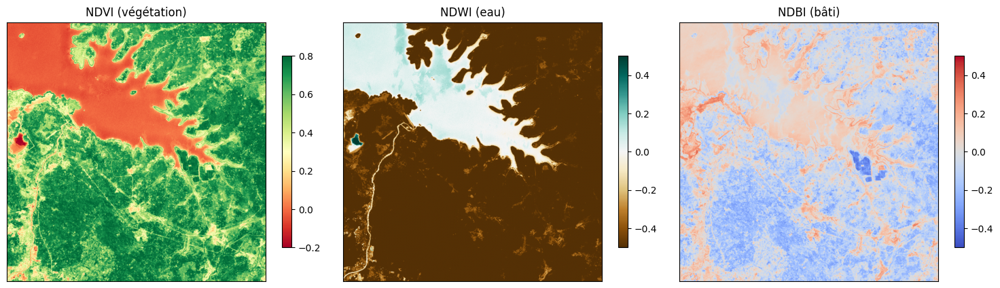

In [16]:
# bandes du GeoTIFF : 0=B3 (vert), 1=B4 (rouge), 2=B8 (PIR), 3=B11 (MIR)
ndvi = rs.ndvi(red_band=1, nir_band=2)     # (PIR - R) / (PIR + R)
ndwi = rs.ndwi(green_band=0, nir_band=2)   # (V - PIR) / (V + PIR)
ndbi = rs.ndbi(swir_band=3, nir_band=2)    # (MIR - PIR) / (MIR + PIR)

# NDVI recalculé à la main : raster_calculator nomme les bandes B1, B2, B3, B4
ndvi_manuel = rs.raster_calculator("(B3 - B2) / (B3 + B2)")
print("NDVI helper vs manuel, écart max :",
      float(np.nanmax(np.abs(ndvi.data[0] - ndvi_manuel.data[0]))))

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, r, titre, cmap, lim in zip(
    axes, [ndvi, ndwi, ndbi],
    ["NDVI (végétation)", "NDWI (eau)", "NDBI (bâti)"],
    ["RdYlGn", "BrBG", "coolwarm"],
    [(-0.2, 0.8), (-0.5, 0.5), (-0.5, 0.5)],
):
    im = ax.imshow(r.data[0], cmap=cmap, vmin=lim[0], vmax=lim[1])
    ax.set_title(titre); ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=ax, shrink=0.6)
fig.tight_layout()

## 15. Classification supervisée

`supervised_classification(training_data, label_column, method=...)` entraîne
un classifieur (`random_forest`, `svm`, `gradient_boosting`) sur des
polygones étiquetés puis prédit sur toute l'image. `accuracy_assessment`
évalue le résultat (précision globale, kappa, précision par classe).

Faute d'échantillons de terrain, on fabrique ici une **pseudo-vérité** à
partir des indices — dans un vrai projet, `training_data` serait des
polygones digitalisés sur le terrain ou photo-interprétés.

polygones d'entraînement par classe : {0: 15, 1: 15, 2: 15, 3: 15}


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 1.00


   Étendue: [-5.58, -5.28, 6.91, 7.11]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 1.00


   Étendue: [-5.58, -5.28, 6.91, 7.11]


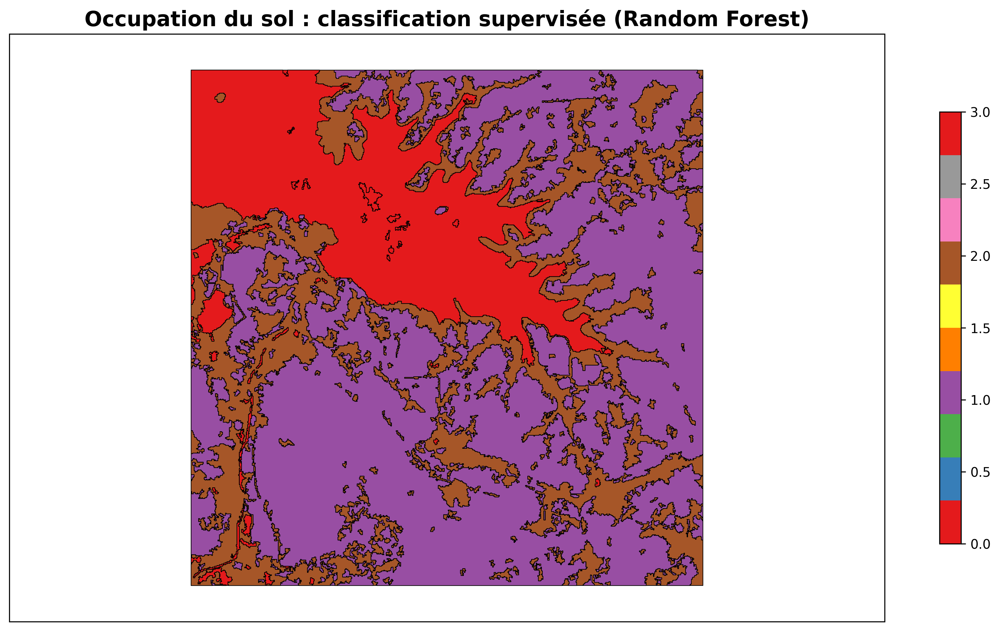

In [17]:
# pseudo-vérité terrain dérivée des indices (faute d'échantillons de terrain)
lab = np.full(ndvi.data[0].shape, -1, dtype="int32")
lab[ndwi.data[0] > 0.0] = 0                                     # eau
lab[ndvi.data[0] > 0.60] = 1                                    # végétation dense
lab[(ndvi.data[0] > 0.20) & (ndvi.data[0] <= 0.60)] = 2         # cultures / clairsemé
lab[(ndvi.data[0] <= 0.20) & (ndbi.data[0] > -0.05)] = 3        # bâti / sol nu

lab_rt = RasterTools((lab[np.newaxis, ...],
                      {**rs.profile, "dtype": "int32", "count": 1, "nodata": -1}))

# on garde les plus grandes zones de chaque classe comme polygones d'entraînement
zones_ech = lab_rt.polygonize_raster(band_index=0)
zones_ech = zones_ech[zones_ech["value"] >= 0]
train = (zones_ech.assign(a=zones_ech.to_crs("EPSG:3857").area)
         .sort_values("a", ascending=False).groupby("value").head(15)
         .drop(columns="a").reset_index(drop=True))
print("polygones d'entraînement par classe :",
      train["value"].value_counts().sort_index().to_dict())

classif = rs.supervised_classification(
    train, label_column="value", method="random_forest", n_estimators=60,
)

NOMS = {0: "Eau", 1: "Végétation dense", 2: "Cultures", 3: "Bâti / sol nu"}
poly_cl = (classif.sieve_raster(threshold=20)
           .polygonize_raster(band_index=0))
poly_cl = poly_cl[poly_cl["value"] >= 0].dissolve(by="value").reset_index()
poly_cl["classe"] = poly_cl["value"].map(NOMS)

m = cp.Map(title="Occupation du sol : classification supervisée (Random Forest)")
m.add_polygons_choropleth(poly_cl, column_to_plot="value", cmap="Set1", show_labels=False)
m.show()

In [18]:
import rasterio
import geopandas as gpd
from shapely.geometry import Point

# points de contrôle tirés au hasard dans la pseudo-vérité terrain
rng = np.random.default_rng(0)
ii = rng.integers(0, lab.shape[0], 500)
jj = rng.integers(0, lab.shape[1], 500)
val = lab[ii, jj]
keep = val >= 0

t = rs.profile["transform"]
xy = [rasterio.transform.xy(t, int(r), int(c)) for r, c in zip(ii[keep], jj[keep])]
controle = gpd.GeoDataFrame(
    {"classe": val[keep]}, geometry=[Point(x, y) for x, y in xy], crs="EPSG:4326",
)

rapport = classif.accuracy_assessment(classif, controle, label_column="classe")
print("précision globale :", round(rapport["overall_accuracy"], 3),
      "| kappa :", round(rapport["kappa"], 3))
print("par classe :", {NOMS[k]: round(v, 2) for k, v in rapport["per_class_accuracy"].items()})

précision globale : 0.998 | kappa : 0.997
par classe : {'Végétation dense': 1.0, 'Cultures': 1.0, 'Bâti / sol nu': 0.99}


## 16. Export

`export_geotiff` (GeoTIFF compressé), `export_cog` (Cloud-Optimized
GeoTIFF), `export_ascii_grid` (ESRI ASCII), `export_png_map` (aperçu PNG
colorisé).

In [19]:
Path("_raster_cache").mkdir(exist_ok=True)

rt_utm.compute_slope().export_geotiff("_raster_cache/man_pente.tif")
rt_utm.reproject_raster("EPSG:4326").export_png_map("_raster_cache/man_mnt.png", colormap="terrain")
rt_utm.export_cog("_raster_cache/man_mnt_cog.tif")
classes.export_ascii_grid("_raster_cache/man_classes.asc", band_index=0)

ndvi.export_geotiff("_raster_cache/yamoussoukro_ndvi.tif")
classif.export_geotiff("_raster_cache/yamoussoukro_occupation_sol.tif")

print(sorted(p.name for p in Path("_raster_cache").iterdir()))

['kossou_s2.tif', 'man_classes.asc', 'man_mnt.png', 'man_mnt_cog.tif', 'man_pente.tif', 'yamoussoukro_ndvi.tif', 'yamoussoukro_occupation_sol.tif', 'yamoussoukro_s2.tif']
